In [1]:
import pandas as pd
file_path= 'C:/Users/ramya/Downloads/suggestions.csv'
df=pd.read_csv('C:/Users/ramya/Downloads/suggestions.csv')
df.head()


,Recommended,Suggestion_Id,Responses,Views,Votes_Up,Votes_Down,Author_Id,Author_Join (in terms of how many days since they joined),Author_TotalPosts,Author_PostsPerDay
0,0,35463,77,3849,242,7,4886,1615,8977,5.6
1,0,37480,428,28290,1149,201,3654,1617,2543,1.6
2,0,39814,160,7561,648,45,113401,1385,1003,0.7
3,0,41970,89,9937,197,14,8331,1601,223,0.1
4,1,47967,12,6977,0,0,13980,1593,3978,2.5


In [2]:
num_rows, num_cols = df.shape
print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_cols}")

Number of rows: 16429
Number of columns: 10


In [3]:
missing_count = df.isnull().sum()

# Calculate the total count of missing values
total_missing = missing_count.sum()

# Calculate the percentage of missing values
total_rows = len(df)
percent_missing = (total_missing / (total_rows * len(df.columns))) * 100
print("Count of Missing Values:")
print(missing_count)
print("\nTotal Missing Values:", total_missing)
print("Percentage of Missing Values: {:.2f}%".format(percent_missing))

Count of Missing Values:
Recommended                                                  0
Suggestion_Id                                                0
Responses                                                    0
Views                                                        0
Votes_Up                                                     0
Votes_Down                                                   0
Author_Id                                                    0
Author_Join (in terms of how many days since they joined)    0
Author_TotalPosts                                            0
Author_PostsPerDay                                           0
dtype: int64

Total Missing Values: 0
Percentage of Missing Values: 0.00%


In [4]:
column_info = []

# Iterate through each column
for column in df.columns:
    column_data = {
        'Column Name': column,
        'Data Type': str(df[column].dtype)
    }

    # Check if it's a numeric attribute
    if pd.api.types.is_numeric_dtype(df[column]):
        column_data['Attribute Type'] = 'Numeric'

        # Calculate statistics
        column_data['Min'] = df[column].min()
        column_data['Max'] = df[column].max()
        column_data['Mean'] = df[column].mean()
        column_data['Median'] = df[column].median()
        column_data['Standard Deviation'] = df[column].std()
    
        # For numeric attributes, no top 3 values are applicable
        column_data['Top 3 Values'] = None
    
    # Check if it's a discrete attribute
    elif pd.api.types.is_categorical_dtype(df[column]) or pd.api.types.is_string_dtype(df[column]):
        column_data['Attribute Type'] = 'Discrete'

        # Calculate unique values
        unique_values = df[column].nunique()
        column_data['Unique Values'] = unique_values

        # Handle top 3 values
        if unique_values <= 3:
            top_3_values = df[column].value_counts().to_dict()
        else:
            top_3_values = dict(df[column].value_counts().head(3))
        column_data['Top 3 Values'] = top_3_values
    
    # Check for missing values
    missing_percentage = df[column].isnull().mean() * 100
    column_data['Missingness (%)'] = missing_percentage

    # Append column information to the list
    column_info.append(column_data)

# Create a DataFrame from the list of column information
column_info_df = pd.DataFrame(column_info)

# Display the results
print(column_info_df)

                                         Column Name Data Type Attribute Type  \
0                                        Recommended     int64        Numeric   
1                                      Suggestion_Id     int64        Numeric   
2                                          Responses     int64        Numeric   
3                                              Views     int64        Numeric   
4                                           Votes_Up     int64        Numeric   
5                                         Votes_Down     int64        Numeric   
6                                          Author_Id     int64        Numeric   
7  Author_Join (in terms of how many days since t...     int64        Numeric   
8                                  Author_TotalPosts     int64        Numeric   
9                                 Author_PostsPerDay   float64        Numeric   

       Min        Max           Mean    Median  Standard Deviation  \
0      0.0        1.0       0.034208  

In [5]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")
profile.to_file("profiling_report_GP.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
duplicates = df[df.duplicated()]
total_duplicates = df.duplicated().sum()

# Display the total count of duplicates
print("Total Count of Duplicates:", total_duplicates)
duplicate_columns = df.columns[df.apply(lambda x: x.duplicated()).any()]

# Display the columns with duplicates
print("Columns with duplicate values:")
print(duplicate_columns)

Total Count of Duplicates: 3
Columns with duplicate values:
Index(['Recommended', 'Suggestion_Id', 'Responses', 'Views', 'Votes_Up',
       'Votes_Down', 'Author_Id',
       'Author_Join (in terms of how many days since they joined)',
       'Author_TotalPosts', 'Author_PostsPerDay'],
      dtype='object')


In [8]:
df =df[~df.duplicated()]
duplicates = df[df.duplicated()]
total_duplicates = df.duplicated().sum()

# Display the total count of duplicates
print("Total Count of Duplicates:", total_duplicates)

Total Count of Duplicates: 0


In [9]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Outliers in 'Responses':
       Recommended  Suggestion_Id  Responses  Views  Votes_Up  Votes_Down  \
0                0          35463         77   3849       242           7   
1                0          37480        428  28290      1149         201   
2                0          39814        160   7561       648          45   
3                0          41970         89   9937       197          14   
5                1          50219         62   1608       121          13   
...            ...            ...        ...    ...       ...         ...   
15769            0         287721         47   2092        26           4   
15874            0         289975         70   2799        20           4   
15889            0         290136         43   1102         6           2   
15892            0         290258         91   2135        11           4   
16199            0         296287         42   2101        23           0   

       Author_Id  Author_Join (in terms of how man

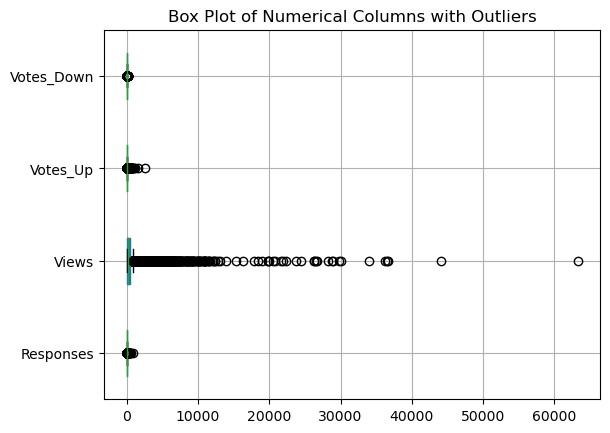

In [10]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
# Define the numerical columns you want to check for outliers
numerical_columns = ['Responses', 'Views', 'Votes_Up', 'Votes_Down']

# Function to detect and display outliers
def find_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Detect and display outliers for each numerical column
for column in numerical_columns:
    outliers = find_outliers(df, column)
    print(f"Outliers in '{column}':")
    print(outliers)

# Visualize outliers using box plots
df[numerical_columns].boxplot(whis=1.5, vert=False, patch_artist=True, widths=0.5)
plt.title('Box Plot of Numerical Columns with Outliers')
plt.show()


In [11]:
import pandas as pd

# Define the numerical columns you want to check for outliers
numerical_columns = ['Responses', 'Views', 'Votes_Up', 'Votes_Down']

# Function to remove outliers based on IQR
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter the data to remove outliers
    data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return data

# Create a copy of the original DataFrame
df_no_outliers = df.copy()

# Remove outliers for each numerical column
for column in numerical_columns:
    df_no_outliers = remove_outliers_iqr(df_no_outliers, column)

# Display the shape of the original and filtered DataFrame
print(f'Shape of the original DataFrame: {df.shape}')
print(f'Shape of the DataFrame without outliers: {df_no_outliers.shape}')

# df_no_outliers now contains the dataset with outliers removed


Shape of the original DataFrame: (16426, 10)
Shape of the DataFrame without outliers: (11442, 10)


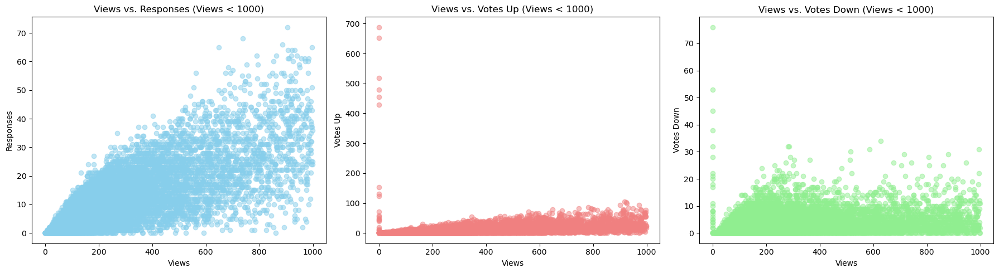

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt

# Filter data where Views are less than a threshold (e.g., 1000)
threshold_views = 1000
filtered_data = df[df['Views'] < threshold_views]

# Create subplots to display scatter plots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Scatter plot for Views vs. Responses (filtered data)
axes[0].scatter(filtered_data['Views'], filtered_data['Responses'], color='skyblue', alpha=0.5)
axes[0].set_xlabel('Views')
axes[0].set_ylabel('Responses')
axes[0].set_title('Views vs. Responses (Views < 1000)')

# Scatter plot for Views vs. Votes_Up (filtered data)
axes[1].scatter(filtered_data['Views'], filtered_data['Votes_Up'], color='lightcoral', alpha=0.5)
axes[1].set_xlabel('Views')
axes[1].set_ylabel('Votes Up')
axes[1].set_title('Views vs. Votes Up (Views < 1000)')

# Scatter plot for Views vs. Votes_Down (filtered data)
axes[2].scatter(filtered_data['Views'], filtered_data['Votes_Down'], color='lightgreen', alpha=0.5)
axes[2].set_xlabel('Views')
axes[2].set_ylabel('Votes Down')
axes[2].set_title('Views vs. Votes Down (Views < 1000)')

plt.tight_layout()
plt.show()


C:\Users\ramya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


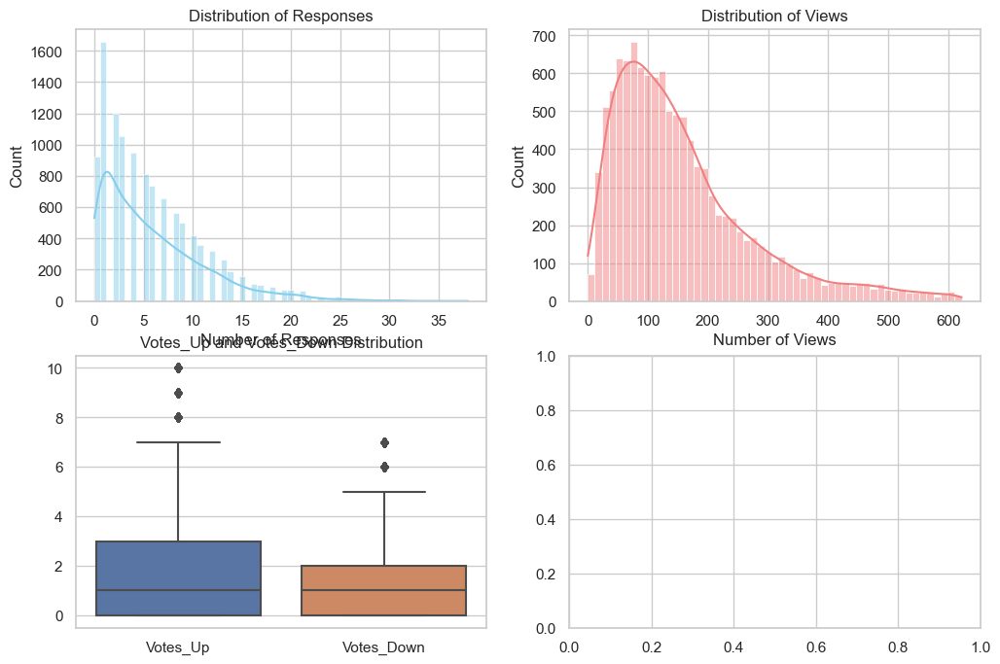

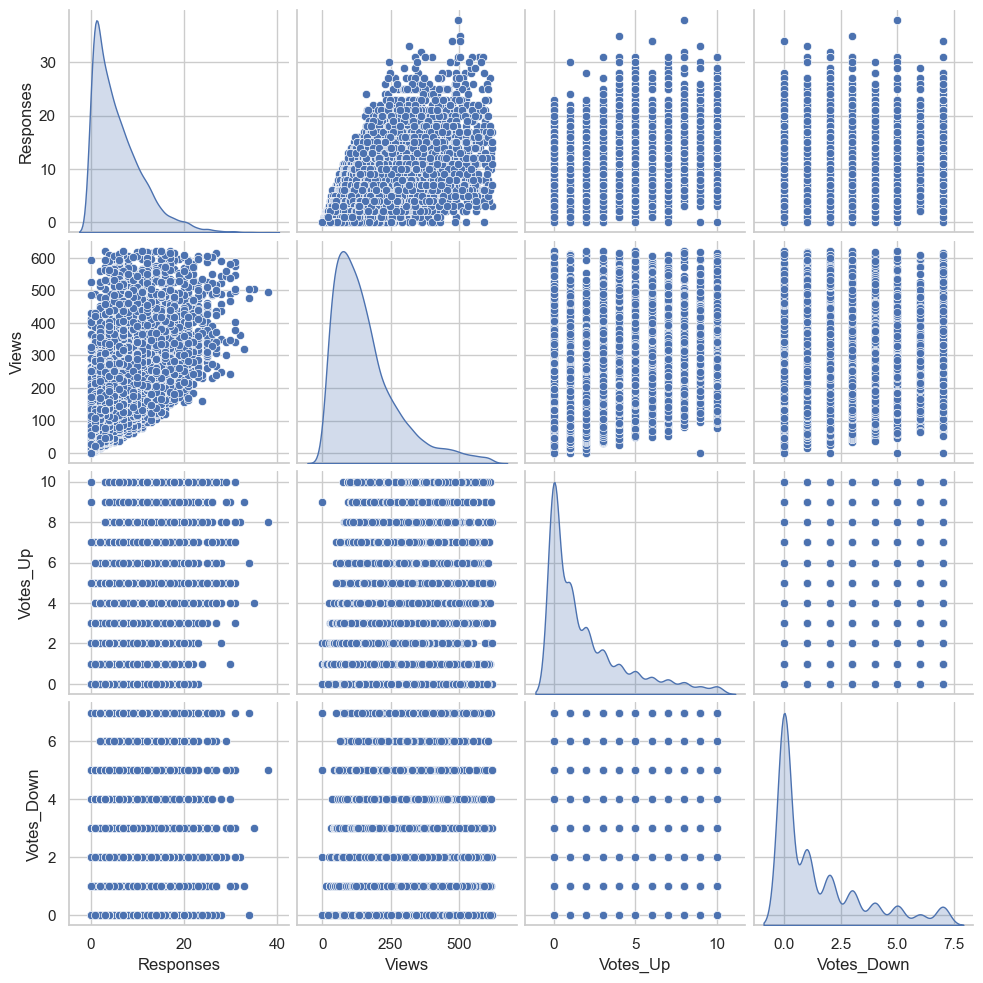

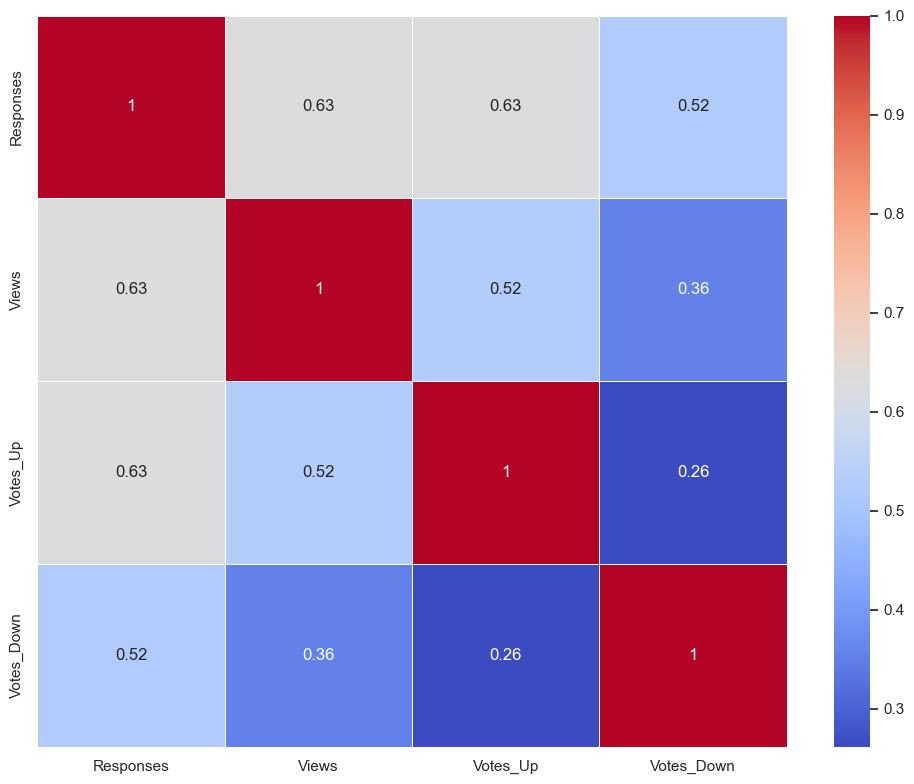

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for Seaborn
sns.set(style="whitegrid")

# Create subplots for visualization
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograms for cleaned dataset
sns.histplot(df_no_outliers['Responses'], kde=True, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Distribution of Responses')
axes[0, 0].set_xlabel('Number of Responses')

sns.histplot(df_no_outliers['Views'], kde=True, ax=axes[0, 1], color='lightcoral')
axes[0, 1].set_title('Distribution of Views')
axes[0, 1].set_xlabel('Number of Views')

# Box plots for cleaned dataset
sns.boxplot(data=df_no_outliers[['Votes_Up', 'Votes_Down']], ax=axes[1, 0,])
axes[1, 0].set_title('Votes_Up and Votes_Down Distribution')

# Pair plot for numerical columns
sns.pairplot(data=df_no_outliers[['Responses', 'Views', 'Votes_Up', 'Votes_Down']], diag_kind='kde', markers='o')

# Display a correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df_no_outliers[['Responses', 'Views', 'Votes_Up', 'Votes_Down']].corr(), annot=True, cmap='coolwarm', linewidths=.5)

# Show the plots
plt.tight_layout()
plt.show()


In [16]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


In [23]:
# performed random forest on the dataset before removing outliers

import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# Load the original dataset
df = pd.read_csv('C:/Users/ramya/Downloads/suggestions.csv')

# Define your features (independent variables) and the target variable (output variable)
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down']]
y = df['Recommended']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Make predictions on the test data
y_pred = random_forest.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the evaluation metrics
print(f'Accuracy: {accuracy:.2f}')
print('Confusion Matrix:\n', confusion)
print('Classification Report:\n', classification_rep)


Accuracy: 0.97
Confusion Matrix:
 [[3121   49]
 [  65   51]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98      3170
           1       0.51      0.44      0.47       116

    accuracy                           0.97      3286
   macro avg       0.74      0.71      0.73      3286
weighted avg       0.96      0.97      0.96      3286



In [24]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Load the dataset
file_path = 'C:/Users/ramya/Downloads/suggestions.csv'
df = pd.read_csv(file_path)

# Define your features (independent variables) and the target variable (output variable)
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down']]
y = df['Recommended']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Make predictions on the test data
y_pred = random_forest.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

# Print the evaluation metrics
print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1:.2f}')
print(f'ROC AUC: {roc_auc:.2f}')



Accuracy: 0.97
Precision: 0.51
Recall: 0.44
F1-Score: 0.47
ROC AUC: 0.71


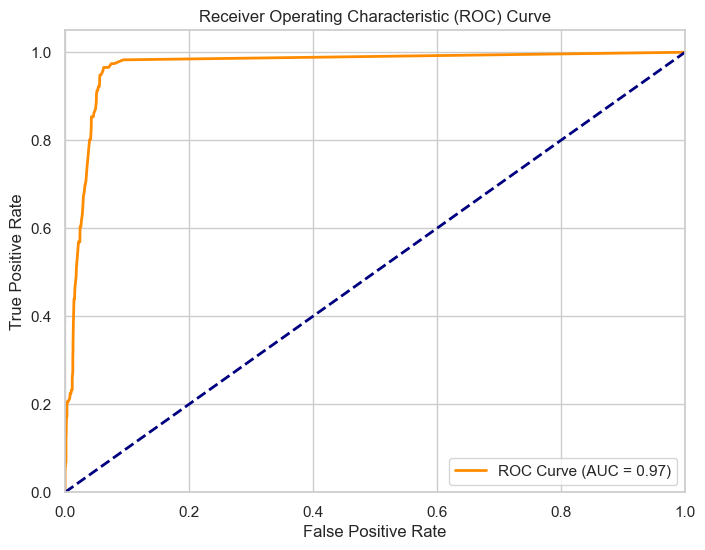

In [25]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'C:/Users/ramya/Downloads/suggestions.csv'
df = pd.read_csv(file_path)

# Define your features (independent variables) and the target variable (output variable)
X = df[['Responses', 'Views', 'Votes_Up', 'Votes_Down']]
y = df['Recommended']

# Split the dataset into a training set and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
random_forest = RandomForestClassifier(random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Get predicted probabilities for the positive class
y_probs = random_forest.predict_proba(X_test)[:, 1]

# Calculate ROC curve values
fpr, tpr, thresholds = roc_curve(y_test, y_probs)

# Calculate AUC (Area Under the Curve)
roc_auc = roc_auc_score(y_test, y_probs)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
